In [1]:
# DIVERGING COLORMAPS

In [1]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geocat.viz.util as gv
import cmaps, cmocean

ERROR 1: PROJ: proj_create_from_database: Open of ~/conda-envs/modeling/share/proj failed


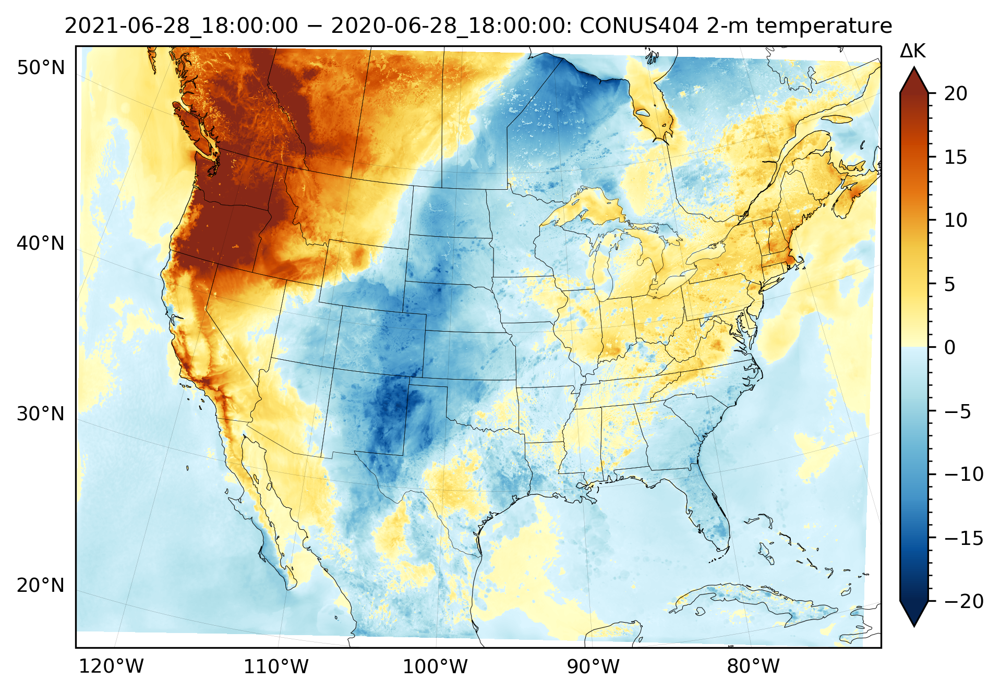

In [7]:
############################################
# cmaps.BlueYellowRed for Temperature
############################################

### Color map
cmap_name = 'BlueYellowRed'
mpl.colormaps.unregister(cmap_name)
colormap = getattr(cmaps,cmap_name)

### Import data for two separate days
datadir = '/glade/campaign/collections/rda/data/ds559.0/'
d1 = '2021-06-28_18:00:00'
ds1 = xr.open_dataset(f'{datadir}/wy2021/202106/wrf2d_d01_{d1}.nc')
var1 = ds1['T2'].isel(Time=0).to_numpy()
d2 = '2020-06-28_18:00:00'
ds2 = xr.open_dataset(f'{datadir}/wy2020/202006/wrf2d_d01_{d2}.nc')
var2 = ds2['T2'].isel(Time=0).to_numpy()
xlat, xlon = ds1['XLAT'].to_numpy(), ds1['XLONG'].to_numpy()
vardiff = var1 - var2

### Figure parameters 
data_proj = ccrs.PlateCarree()
map_proj = ccrs.LambertConformal()
loval, hival, spval, majtick, mintick = -20, 20, 0.5, 5, 1

### Intialize figure
fig, ax = plt.subplots(figsize=(8,8),dpi=300,subplot_kw=dict(projection=map_proj))
ax.add_feature(cfeature.COASTLINE,linewidths=0.25)
ax.add_feature(cfeature.STATES,linewidths=0.15)
ax.set_title(f'{d1} $\minus$ {d2}: CONUS404 2-m temperature',loc='center',fontsize=10);

### Ticks and gridlines
gl = ax.gridlines(crs=data_proj,draw_labels=True,alpha=0.5,lw=0.1,color='k',linestyle='--',
                  x_inline=False,y_inline=False)
gl.top_labels, gl.bottom_labels, gl.left_labels, gl.right_labels = False, True, True, False
gl.ylocator, gl.xlocator = mpl.ticker.MultipleLocator(10.), mpl.ticker.MultipleLocator(10.)
gl.ylabel_style = {'size':9,'rotation':0,'ha':'right','va':'center'}
gl.xlabel_style = {'size':9,'rotation':0,'ha':'center','va':'top'}
gl.ypadding, gl.xpadding = 5, 5

### Plot variable
cntr = ax.pcolormesh(xlon,xlat,vardiff,cmap=colormap,transform=data_proj,vmin=loval,vmax=hival) 

### Color Bar
bar = fig.colorbar(cntr,ax=ax,orientation='vertical',ticks=mpl.ticker.MultipleLocator(majtick),
                   shrink=0.58,pad=0.02,spacing='proportional',extend='both')
bar.ax.yaxis.set_minor_locator(mpl.ticker.MultipleLocator(mintick))
bar.ax.tick_params(labelsize=9)
ax.text(1.04,0.99,'$\Delta$K',ha='center',va='center',fontsize=9,transform=ax.transAxes); 

### Save figure
plt.savefig(f'Diverging_Temperature_{cmap_name}.png',bbox_inches='tight')


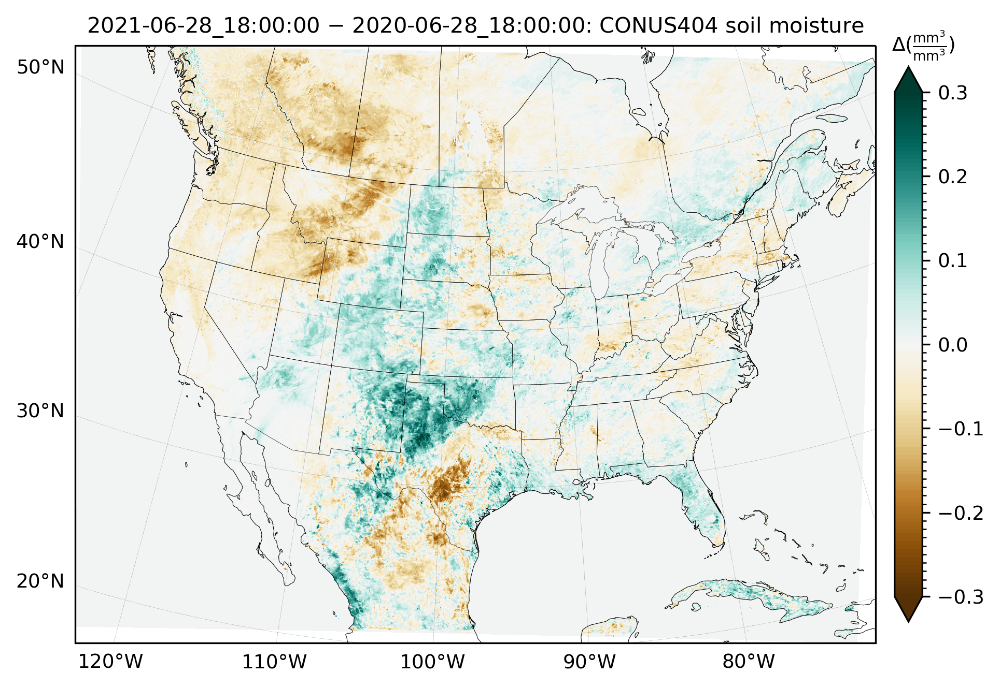

In [18]:
############################################
# cmaps.MPL_BrBG for Soil Moisture
############################################

### Color map
cmap_name = 'MPL_BrBG'
mpl.colormaps.unregister(cmap_name)
colormap = getattr(cmaps,cmap_name)

### Import data for two separate days
datadir = '/glade/campaign/collections/rda/data/ds559.0/'
d1 = '2021-06-28_18:00:00'
ds1 = xr.open_dataset(f'{datadir}/wy2021/202106/wrf2d_d01_{d1}.nc')
var1 = ds1['SMOIS'].isel(Time=0).isel(soil_layers_stag=0).to_numpy()
d2 = '2020-06-28_18:00:00'
ds2 = xr.open_dataset(f'{datadir}/wy2020/202006/wrf2d_d01_{d2}.nc')
var2 = ds2['SMOIS'].isel(Time=0).isel(soil_layers_stag=0).to_numpy()
xlat, xlon = ds1['XLAT'].to_numpy(), ds1['XLONG'].to_numpy()
vardiff = var1 - var2

### Figure parameters 
data_proj = ccrs.PlateCarree()
map_proj = ccrs.LambertConformal()
loval, hival, spval, majtick, mintick = -0.3, 0.3, 0.01, 0.1, 0.01

### Intialize figure
fig, ax = plt.subplots(figsize=(8,8),dpi=300,subplot_kw=dict(projection=map_proj))
ax.add_feature(cfeature.COASTLINE,linewidths=0.25)
ax.add_feature(cfeature.STATES,linewidths=0.15)
ax.set_title(f'{d1} $\minus$ {d2}: CONUS404 soil moisture',loc='center',fontsize=10);

### Ticks and gridlines
gl = ax.gridlines(crs=data_proj,draw_labels=True,alpha=0.5,lw=0.1,color='k',linestyle='--',
                  x_inline=False,y_inline=False)
gl.top_labels, gl.bottom_labels, gl.left_labels, gl.right_labels = False, True, True, False
gl.ylocator, gl.xlocator = mpl.ticker.MultipleLocator(10.), mpl.ticker.MultipleLocator(10.)
gl.ylabel_style = {'size':9,'rotation':0,'ha':'right','va':'center'}
gl.xlabel_style = {'size':9,'rotation':0,'ha':'center','va':'top'}
gl.ypadding, gl.xpadding = 5, 5

### Plot variable
cntr = ax.pcolormesh(xlon,xlat,vardiff,cmap=colormap,transform=data_proj,vmin=loval,vmax=hival) 

### Color Bar
bar = fig.colorbar(cntr,ax=ax,orientation='vertical',ticks=mpl.ticker.MultipleLocator(majtick),
                   shrink=0.58,pad=0.02,spacing='proportional',extend='both')
bar.ax.yaxis.set_minor_locator(mpl.ticker.MultipleLocator(mintick))
bar.ax.tick_params(labelsize=9)
ax.text(1.06,1.00,r'$\Delta$($\frac{\mathrm{mm^{3}}}{\mathrm{mm^{3}}}$)',ha='center',va='center',fontsize=9,transform=ax.transAxes); 

### Save figure
plt.savefig(f'Diverging_SoilMoisture_{cmap_name}.png',bbox_inches='tight')


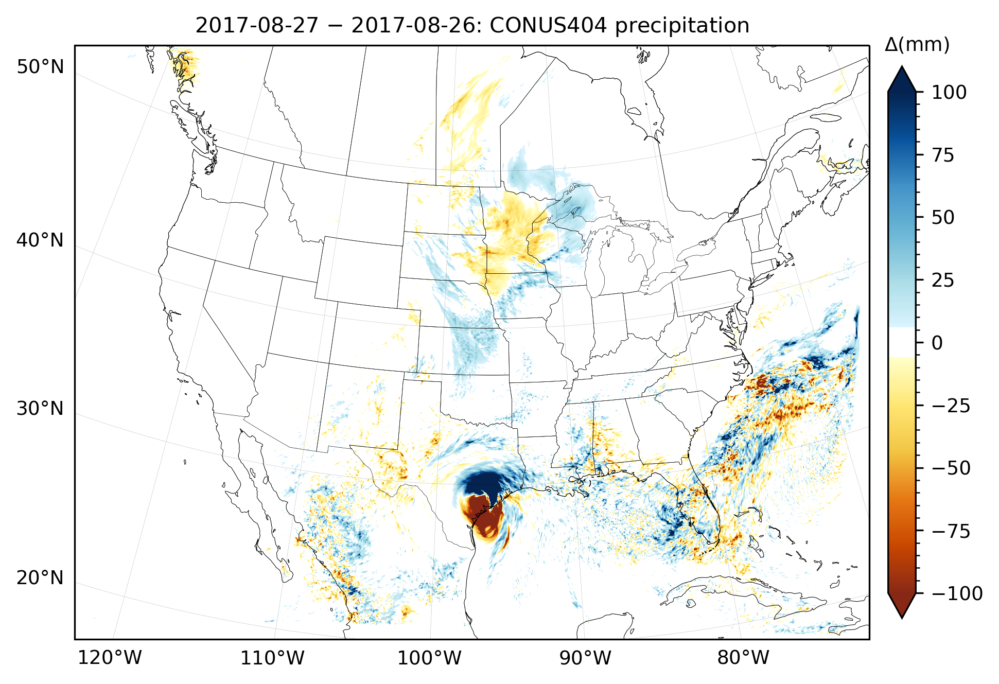

In [44]:
############################################
# cmaps.BlueYellowRed_r with white in middle
############################################

### Color map
cmap_name = 'BlueYellowRed_r'
spacing = 16 # keep as multiples of 4, larger numbers = more white space in the middle
mpl.colormaps.unregister(cmap_name)
cmap_orig = getattr(cmaps,cmap_name)
cmap_length = cmap_orig.N
colors = cmap_orig(np.linspace(0,1,cmap_length))
colors = np.insert(colors,len(colors)//2,[[1,1,1,1] for _ in range(spacing)],axis=0)
colormap = mpl.colors.LinearSegmentedColormap.from_list(cmap_name+'_new',colors,N=cmap_length+spacing)

### Import data for two separate days
datadir = '/glade/campaign/collections/rda/data/ds559.0/'
d1 = '2017-08-27'
wy1 = d1[0:4] if int(d1[5:7]) < 10 else str(int(d1[0:4])+1) 
ds1 = xr.open_mfdataset([f'{datadir}/wy{wy1}/{d1[0:4]}{d1[5:7]}/wrf2d_d01_{d1}_{i:02}:00:00.nc' for i in range(0,24)])
var1 = ds1['PREC_ACC_NC'].sum(dim='Time').to_numpy()
d2 = '2017-08-26'
wy2 = d2[0:4] if int(d2[5:7]) < 10 else str(int(d2[0:4])+1) 
ds2 = xr.open_mfdataset([f'{datadir}/wy{wy2}/{d2[0:4]}{d2[5:7]}/wrf2d_d01_{d2}_{i:02}:00:00.nc' for i in range(0,24)])
var2 = ds2['PREC_ACC_NC'].sum(dim='Time').to_numpy()
xlat, xlon = ds1['XLAT'].to_numpy(), ds1['XLONG'].to_numpy()
vardiff = var1 - var2

### Figure parameters 
data_proj = ccrs.PlateCarree()
map_proj = ccrs.LambertConformal()
loval, hival, spval, majtick, mintick = -100, 100, 2, 25, 5

### Intialize figure
fig, ax = plt.subplots(figsize=(8,8),dpi=300,subplot_kw=dict(projection=map_proj))
ax.add_feature(cfeature.COASTLINE,linewidths=0.25)
ax.add_feature(cfeature.STATES,linewidths=0.15)
ax.set_title(f'{d1} $\minus$ {d2}: CONUS404 precipitation',loc='center',fontsize=10);

### Ticks and gridlines
gl = ax.gridlines(crs=data_proj,draw_labels=True,alpha=0.5,lw=0.1,color='k',linestyle='--',
                  x_inline=False,y_inline=False)
gl.top_labels, gl.bottom_labels, gl.left_labels, gl.right_labels = False, True, True, False
gl.ylocator, gl.xlocator = mpl.ticker.MultipleLocator(10.), mpl.ticker.MultipleLocator(10.)
gl.ylabel_style = {'size':9,'rotation':0,'ha':'right','va':'center'}
gl.xlabel_style = {'size':9,'rotation':0,'ha':'center','va':'top'}
gl.ypadding, gl.xpadding = 5, 5

### Plot variable
cntr = ax.pcolormesh(xlon,xlat,vardiff,cmap=colormap,transform=data_proj,vmin=loval,vmax=hival) 

### Color Bar
bar = fig.colorbar(cntr,ax=ax,orientation='vertical',ticks=mpl.ticker.MultipleLocator(majtick),
                   shrink=0.58,pad=0.02,spacing='proportional',extend='both')
bar.ax.yaxis.set_minor_locator(mpl.ticker.MultipleLocator(mintick))
bar.ax.tick_params(labelsize=9)
ax.text(1.06,1.00,r'$\Delta$(mm)',ha='center',va='center',fontsize=9,transform=ax.transAxes); 

### Save figure
plt.savefig(f'Diverging_Precipitation_{cmap_name}.png',bbox_inches='tight')


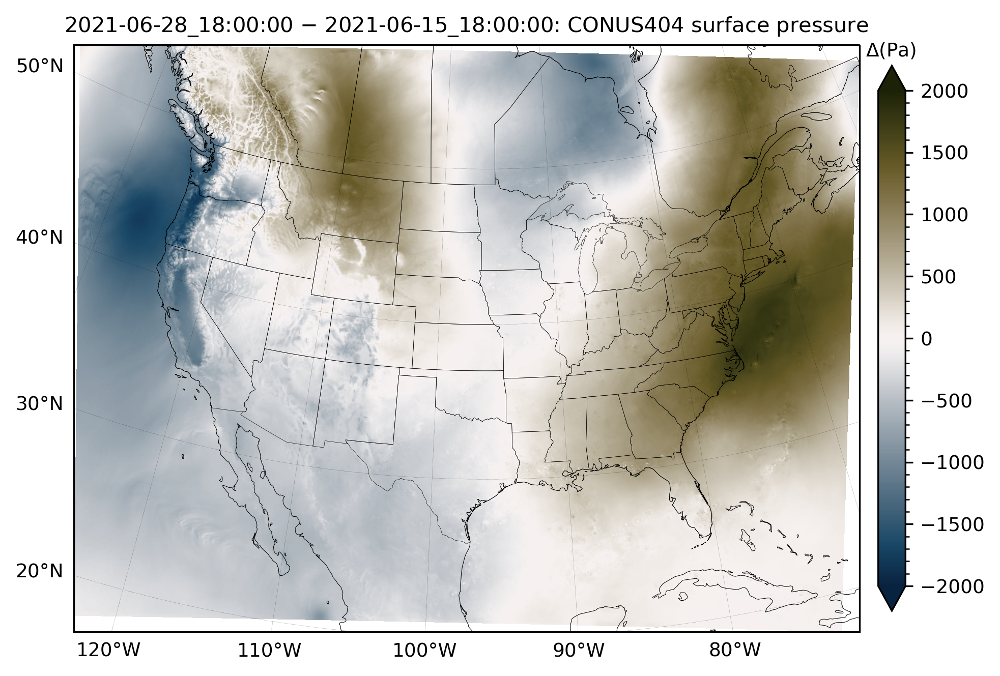

In [54]:
############################################
# cmocean.cm.diff for surface pressure
############################################

### Color map
cmap_name = 'cmocean.cm.diff'
colormap = cmocean.cm.diff

### Import data for two separate days
datadir = '/glade/campaign/collections/rda/data/ds559.0/'
d1 = '2021-06-28_18:00:00'
ds1 = xr.open_dataset(f'{datadir}/wy2021/202106/wrf2d_d01_{d1}.nc')
var1 = ds1['PSFC'].isel(Time=0).to_numpy()
d2 = '2021-06-15_18:00:00'
ds2 = xr.open_dataset(f'{datadir}/wy2021/202106/wrf2d_d01_{d2}.nc')
var2 = ds2['PSFC'].isel(Time=0).to_numpy()
xlat, xlon = ds1['XLAT'].to_numpy(), ds1['XLONG'].to_numpy()
vardiff = var1 - var2

### Figure parameters 
data_proj = ccrs.PlateCarree()
map_proj = ccrs.LambertConformal()
loval, hival, spval, majtick, mintick = -2000, 2000, 100, 500, 100

### Intialize figure
fig, ax = plt.subplots(figsize=(8,8),dpi=300,subplot_kw=dict(projection=map_proj))
ax.add_feature(cfeature.COASTLINE,linewidths=0.25)
ax.add_feature(cfeature.STATES,linewidths=0.15)
ax.set_title(f'{d1} $\minus$ {d2}: CONUS404 surface pressure',loc='center',fontsize=10);

### Ticks and gridlines
gl = ax.gridlines(crs=data_proj,draw_labels=True,alpha=0.5,lw=0.1,color='k',linestyle='--',
                  x_inline=False,y_inline=False)
gl.top_labels, gl.bottom_labels, gl.left_labels, gl.right_labels = False, True, True, False
gl.ylocator, gl.xlocator = mpl.ticker.MultipleLocator(10.), mpl.ticker.MultipleLocator(10.)
gl.ylabel_style = {'size':9,'rotation':0,'ha':'right','va':'center'}
gl.xlabel_style = {'size':9,'rotation':0,'ha':'center','va':'top'}
gl.ypadding, gl.xpadding = 5, 5

### Plot variable
cntr = ax.pcolormesh(xlon,xlat,vardiff,cmap=colormap,transform=data_proj,vmin=loval,vmax=hival) 

### Color Bar
bar = fig.colorbar(cntr,ax=ax,orientation='vertical',ticks=mpl.ticker.MultipleLocator(majtick),
                   shrink=0.58,pad=0.02,spacing='proportional',extend='both')
bar.ax.yaxis.set_minor_locator(mpl.ticker.MultipleLocator(mintick))
bar.ax.tick_params(labelsize=9)
ax.text(1.04,0.99,'$\Delta$(Pa)',ha='center',va='center',fontsize=9,transform=ax.transAxes); 

### Save figure
plt.savefig(f'Diverging_PSFC_{cmap_name}.png',bbox_inches='tight')


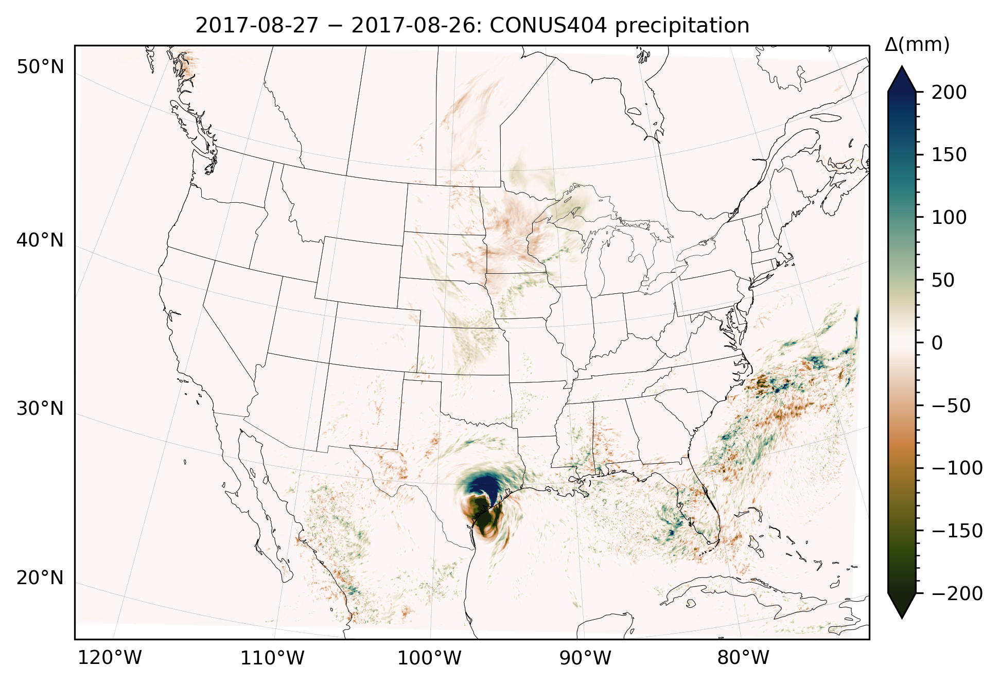

In [58]:
############################################
# cmocean.cm.tarn
############################################

### Color map
cmap_name = 'cmocean.cm.tarn'
colormap = cmocean.cm.tarn

### Import data for two separate days
datadir = '/glade/campaign/collections/rda/data/ds559.0/'
d1 = '2017-08-27'
wy1 = d1[0:4] if int(d1[5:7]) < 10 else str(int(d1[0:4])+1) 
ds1 = xr.open_mfdataset([f'{datadir}/wy{wy1}/{d1[0:4]}{d1[5:7]}/wrf2d_d01_{d1}_{i:02}:00:00.nc' for i in range(0,24)])
var1 = ds1['PREC_ACC_NC'].sum(dim='Time').to_numpy()
d2 = '2017-08-26'
wy2 = d2[0:4] if int(d2[5:7]) < 10 else str(int(d2[0:4])+1) 
ds2 = xr.open_mfdataset([f'{datadir}/wy{wy2}/{d2[0:4]}{d2[5:7]}/wrf2d_d01_{d2}_{i:02}:00:00.nc' for i in range(0,24)])
var2 = ds2['PREC_ACC_NC'].sum(dim='Time').to_numpy()
xlat, xlon = ds1['XLAT'].to_numpy(), ds1['XLONG'].to_numpy()
vardiff = var1 - var2

### Figure parameters 
data_proj = ccrs.PlateCarree()
map_proj = ccrs.LambertConformal()
loval, hival, spval, majtick, mintick = -200, 200, 2, 50, 10

### Intialize figure
fig, ax = plt.subplots(figsize=(8,8),dpi=300,subplot_kw=dict(projection=map_proj))
ax.add_feature(cfeature.COASTLINE,linewidths=0.25)
ax.add_feature(cfeature.STATES,linewidths=0.15)
ax.set_title(f'{d1} $\minus$ {d2}: CONUS404 precipitation',loc='center',fontsize=10);

### Ticks and gridlines
gl = ax.gridlines(crs=data_proj,draw_labels=True,alpha=0.5,lw=0.1,color='k',linestyle='--',
                  x_inline=False,y_inline=False)
gl.top_labels, gl.bottom_labels, gl.left_labels, gl.right_labels = False, True, True, False
gl.ylocator, gl.xlocator = mpl.ticker.MultipleLocator(10.), mpl.ticker.MultipleLocator(10.)
gl.ylabel_style = {'size':9,'rotation':0,'ha':'right','va':'center'}
gl.xlabel_style = {'size':9,'rotation':0,'ha':'center','va':'top'}
gl.ypadding, gl.xpadding = 5, 5

### Plot variable
cntr = ax.pcolormesh(xlon,xlat,vardiff,cmap=colormap,transform=data_proj,vmin=loval,vmax=hival) 

### Color Bar
bar = fig.colorbar(cntr,ax=ax,orientation='vertical',ticks=mpl.ticker.MultipleLocator(majtick),
                   shrink=0.58,pad=0.02,spacing='proportional',extend='both')
bar.ax.yaxis.set_minor_locator(mpl.ticker.MultipleLocator(mintick))
bar.ax.tick_params(labelsize=9)
ax.text(1.06,1.00,r'$\Delta$(mm)',ha='center',va='center',fontsize=9,transform=ax.transAxes); 

### Save figure
plt.savefig(f'Diverging_Precipitation_{cmap_name}.png',bbox_inches='tight')
